In [ ]:
# Start writing code here...

In [ ]:
import sys
sys.path.append('..')

import os
import pickle
import shap

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


from lib.township_range import TownshipRanges
from lib.read_data import combine_datasets
from lib.viz import view_trs_side_by_side, chart_feature_target_relation, create_correlation_scatters, get_feature_target_correlation

from sklearn.preprocessing import scale
from sklearn.neighbors import KernelDensity
from numpy import where, random, array, quantile
from sklearn.ensemble import IsolationForest

%matplotlib inline


The Shapely GEOS version (3.10.3-CAPI-1.16.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.


### Study the Anomalies in the Data : Unsupervised Learning

**[Types of Anomalies](https://machinelearningmastery.com/anomaly-detection-with-isolation-forest-and-kernel-density-estimation/)**
In data science domain, we have three different ways to classify anomalies. Understanding them correctly may have a big impact on how you handle anomalies.

- Point or Global Anomalies: Corresponding to the data points that differ significantly from the rest of the data points, global anomalies are known to be the most common form of anomalies. Usually, global anomalies are found very far away from the mean or median of any data distribution.
- Contextual or Conditional Anomalies: These anomalies have values that differ dramatically from those of the other data points in the same context. Anomalies in one dataset may not be anomalies in another.
- Collective Anomalies: The outlier objects that are tightly clustered because they have the same outlier character are referred to as collective outliers. For example, your server is not under a cyber-attack on a daily basis, therefore, it would be consider as an outlier.

A commonly used anomaly detection algorithm is Isolation Forest, so named because, it isolates a data point that can then be considered as an anomaly. It depends on the supplied threshold level to perform this isolation.

Decision trees are built using information criteria such as **Gini index or entropy**. The difference between a Random Forest Decision tree and Isolation Forest is that in the former groups are separated at the root of the tree and deeper into the branches, based on entropy or GINI index. In Isolation Forest, this decision to get to a pure leaf is based on randomly picked characteristics, and the processes randomly subsamples data in a tree structure. **Samples that reach further into the tree and require more cuts to separate them have a very little probability that they are anomalies.** Likewise, samples that are found on the shorter branches of the tree are more likely to be anomalies, since the tree found it simpler to distinguish them from the other data.

The contamination parameter which sets the percentage of points in our data to be anomalous. 

In [ ]:
dir_path = "../assets/train_test_target_shifted/"
with open(f'{dir_path}train_test_dict_target_shifted.pickle', 'rb') as file:
        train_test_dict = pickle.load( file)
X_train_impute = train_test_dict['X_train_impute']
X_test_impute = train_test_dict['X_test_impute']
y_train = train_test_dict['y_train']
y_test = train_test_dict['y_test']
y_pred = train_test_dict['y_pred']


with open(f'{dir_path}X_train_impute_target_shifted_df.pkl', 'rb') as file:
        X_train_impute_df = pickle.load( file)
with open(f'{dir_path}X_test_impute_target_shifted_df.pkl', 'rb') as file:
        X_test_impute_df = pickle.load( file)


full_df = pd.concat([X_train_impute_df, X_test_impute_df], axis=0)
#print(X_train_impute_df.shape[0], X_test_impute_df.shape[0], full_df.shape[0])

In [ ]:
full_df.sample(5)

,,TOTALDRILLDEPTH_AVG,WELLYIELD_AVG,STATICWATERLEVEL_AVG,TOPOFPERFORATEDINTERVAL_AVG,BOTTOMOFPERFORATEDINTERVAL_AVG,TOTALCOMPLETEDDEPTH_AVG,VEGETATION_HARD_CHAPARRAL,VEGETATION_CALIFORNIA_COAST_LIVE_OAK,VEGETATION_NON-NATIVE_HARDWOOD_FOREST,VEGETATION_BLUE_OAK-GRAY_PINE,...,CROP_D12,CROP_V3,CROP_T6,POPULATION_DENSITY,PCT_OF_CAPACITY,GROUNDSURFACEELEVATION_AVG,WELL_COUNT_AGRICULTURE,WELL_COUNT_DOMESTIC,CURRENT_DEPTH,AVERAGE_YEARLY_PRECIPITATION
TOWNSHIP_RANGE,YEAR,,,,,,,,,,,,,,,,,,,,,
T21S R16E,2015,-0.498229,0.042296,2.838519,4.638543,2.927049,4.790484,0.0,0.0,0.004464,0.0,...,0.000000,0.000000,0.019096,0.364717,0.434017,1.565241,-0.274258,-0.403081,1.456402,-0.507428
T12N R18W,2019,-0.498229,-0.472862,-0.631480,-0.768477,-0.809372,-0.816633,0.0,0.0,0.159578,0.0,...,0.000000,0.000000,0.133788,-0.511800,1.570422,-0.180893,-0.521918,-0.403081,2.072332,0.258811
T10S R15E,2018,1.746416,1.780952,1.069804,0.805856,1.080535,0.728688,0.0,0.0,0.229589,0.0,...,0.608414,0.000000,0.000000,0.060945,-0.259578,-0.459717,0.221064,-0.403081,0.013673,-0.618931
T17S R16E,2015,-0.498229,-0.472862,-0.631480,4.117385,2.569748,1.964497,0.0,0.0,0.000000,0.0,...,0.022260,0.000676,0.000000,-0.524469,0.434017,-0.254713,-0.026597,-0.403081,1.438616,-0.507428
T31S R29E,2014,-0.498229,-0.472862,-0.631480,-0.768477,-0.809372,1.426214,0.0,0.0,0.344290,0.0,...,0.134954,0.242859,0.118934,1.042566,-0.048930,0.937453,-0.274258,-0.403081,0.847169,-1.203851


[From article](https://www.analyticsvidhya.com/blog/2021/05/getting-familiar-with-pycaret-for-anomaly-detection/)

In [ ]:

isomodel = IsolationForest(n_estimators=100, contamination=.05)
full_df['predictions'] = isomodel.fit_predict(full_df)
#np.where(full_df['predictions'] == -1)[0].shape
#There are 39 townshiprange-years considered as anomalies based on a threshold of contamination - 0.01


kern_dens = KernelDensity()
kern_dens.fit(full_df)
 
full_df['scores'] = kern_dens.score_samples(full_df)
threshold = quantile(full_df['scores'], .05)
#print(threshold)

#Make predictions similar to Isolation Forest
full_df['kd_predictions'] =  np.where( full_df['scores'] <= threshold, -1, 1) 
township_range = TownshipRanges()
spatial_df = pd.merge(township_range.sjv_township_range_df, full_df.reset_index(), how="left", on=["TOWNSHIP_RANGE", ])



In [ ]:
view_trs_side_by_side(
    spatial_df,
    feature="YEAR",
    value="predictions",
    title="Township-Ranges predictions by year",
    color_scheme="sjv")

alt.ConcatChart(...)

## [Kernel Density Estimator](https://machinelearningmastery.com/anomaly-detection-with-isolation-forest-and-kernel-density-estimation/)

If we consider the norm of a dataset should fit certain kind of probability distribution, the anomaly are those that we should see them rarely, or in a very low probability. Kernel density estimation is a technique that estimates the probability density function of the data points randomly in a sample space. With the density function, we can detect anomalies in a dataset.

In [ ]:
view_trs_side_by_side(
    spatial_df,
    feature="YEAR",
    value="kd_predictions",
    title="Township-Ranges predictions by year",
    color_scheme="sjv")

alt.ConcatChart(...)

### Observations from the outlier detection algorithms

- Since the Township-Ranges are 6 mile by 6 mile squares, clusters of townships that show anolmaly are more meaningful since that would show an area of similar crops, vegetation or population density. In the isolation forest anomaly detection, there is a repeating cluster of anomalous townships in the central-west of the basin for a series of years from 2014 through 2016.
- This region is also, as per the crops distribution notebook, an area where crops such as pistachios are grown

### Identify top ten townships with most anomalies 

In [ ]:
def get_top_anomalies (train_df = X_train_impute_df, test_df = X_test_impute_df, n_estimators=200, contamination=0.09, top_n = 10):
    
    background_distribution_df = pd.concat([train_df, test_df], axis=0)

    isomodel = IsolationForest(n_estimators=n_estimators, contamination=contamination)
    #Fit the full set for background distribution
    isomodel.fit(background_distribution_df)
    background_distribution_df['predictions'] = isomodel.fit_predict(background_distribution_df)

    # #Get the dataset with anomalies as per Isolation forest
    anomalies_df = background_distribution_df[background_distribution_df['predictions'] < 0].copy()
    anomalies_df.reset_index(inplace=True)
    anomalies_df['TOWNSHIP'] = anomalies_df['TOWNSHIP_RANGE'].str.slice(stop=3)
    top_anomalies_df  = anomalies_df.groupby(['TOWNSHIP', 'YEAR']).agg(anomaly_count=('CURRENT_DEPTH', 'count'))
    top_anomalies_df= top_anomalies_df.sort_values(by=['anomaly_count'], ascending=False).iloc[0:top_n, :]
    anomalies_df = anomalies_df.merge(top_anomalies_df, how='inner', left_on=['TOWNSHIP', 'YEAR'], right_on=['TOWNSHIP', 'YEAR']).iloc[:, :-3]
    return top_anomalies_df, anomalies_df, isomodel




In [ ]:
top_anomalies_df, anomalies_df, isomodel = get_top_anomalies (train_df = X_train_impute_df, test_df = X_test_impute_df, n_estimators=200, contamination=0.09, top_n = 10)
    

What makes for the top anomalies?

In [ ]:
anomalies_df

,TOWNSHIP_RANGE,YEAR,TOTALDRILLDEPTH_AVG,WELLYIELD_AVG,STATICWATERLEVEL_AVG,TOPOFPERFORATEDINTERVAL_AVG,BOTTOMOFPERFORATEDINTERVAL_AVG,TOTALCOMPLETEDDEPTH_AVG,VEGETATION_HARD_CHAPARRAL,VEGETATION_CALIFORNIA_COAST_LIVE_OAK,...,CROP_D12,CROP_V3,CROP_T6,POPULATION_DENSITY,PCT_OF_CAPACITY,GROUNDSURFACEELEVATION_AVG,WELL_COUNT_AGRICULTURE,WELL_COUNT_DOMESTIC,CURRENT_DEPTH,AVERAGE_YEARLY_PRECIPITATION
0,T01N R04E,2016,-0.498229,-0.472862,-0.570869,-0.532327,-0.621028,-0.637206,0.005475,0.007970,...,0.000000,0.000000e+00,0.000000,-0.220336,1.030959,-1.457921,-0.521918,-0.184425,-1.171273,-0.068629
1,T01N R05E,2016,-0.498229,-0.472862,-0.631480,-0.768477,-0.809372,-0.816633,0.004826,0.001700,...,0.025715,0.000000e+00,0.000000,1.588182,1.030959,-1.410127,-0.521918,-0.403081,-1.182526,-0.068629
2,T01S R05E,2016,-0.498229,-0.472862,-0.631480,-0.768477,-0.809372,-0.816633,0.002512,0.002521,...,0.045964,0.000000e+00,0.010316,-0.260112,1.030959,-1.396351,-0.521918,-0.403081,-1.114898,-0.068629
3,T01S R11E,2016,1.419360,7.429652,0.050398,0.208695,0.087341,-0.006405,0.004299,0.006521,...,0.522293,0.000000e+00,0.000000,-0.509863,1.538632,-0.080336,0.468725,0.471544,-0.464536,2.491606
4,T01N R04E,2017,-0.498229,-0.472862,-0.631480,-0.768477,-0.809372,-0.816633,0.005475,0.007970,...,0.000000,0.000000e+00,0.000000,-0.202416,1.030959,-1.457921,-0.521918,-0.403081,-1.189478,-0.036174
5,T01N R05E,2017,-0.498229,-0.472862,-0.631480,-0.768477,-0.809372,-0.816633,0.004826,0.001700,...,0.025715,0.000000e+00,0.000000,1.622565,1.030959,-1.410127,-0.521918,-0.403081,-1.194496,-0.036174
6,T01S R05E,2017,-0.498229,-0.472862,-0.631480,-0.768477,-0.809372,-0.816633,0.002512,0.002521,...,0.045964,0.000000e+00,0.010316,-0.254904,1.030959,-1.396351,-0.521918,-0.403081,-1.083137,-0.036174
7,T01S R12E,2017,3.464789,-0.466422,-0.055672,-0.402037,-0.255418,0.798216,0.010934,0.018325,...,0.005651,0.000000e+00,0.000000,-0.514697,1.538632,1.612641,-0.521918,0.034232,-0.762230,5.525259
8,T11N R17W,2016,-0.498229,-0.472862,-0.631480,-0.768477,-0.809372,-0.816633,0.002420,0.016980,...,0.000000,0.000000e+00,0.000000,-0.531612,1.570422,-0.180893,-0.521918,-0.403081,2.672051,-0.127771
9,T11N R18W,2016,-0.498229,2.231714,3.603737,3.991167,2.458957,1.921883,0.000000,0.000036,...,0.233318,0.000000e+00,0.001151,-0.514001,1.570422,2.132143,-0.274258,-0.403081,2.450493,-0.442950


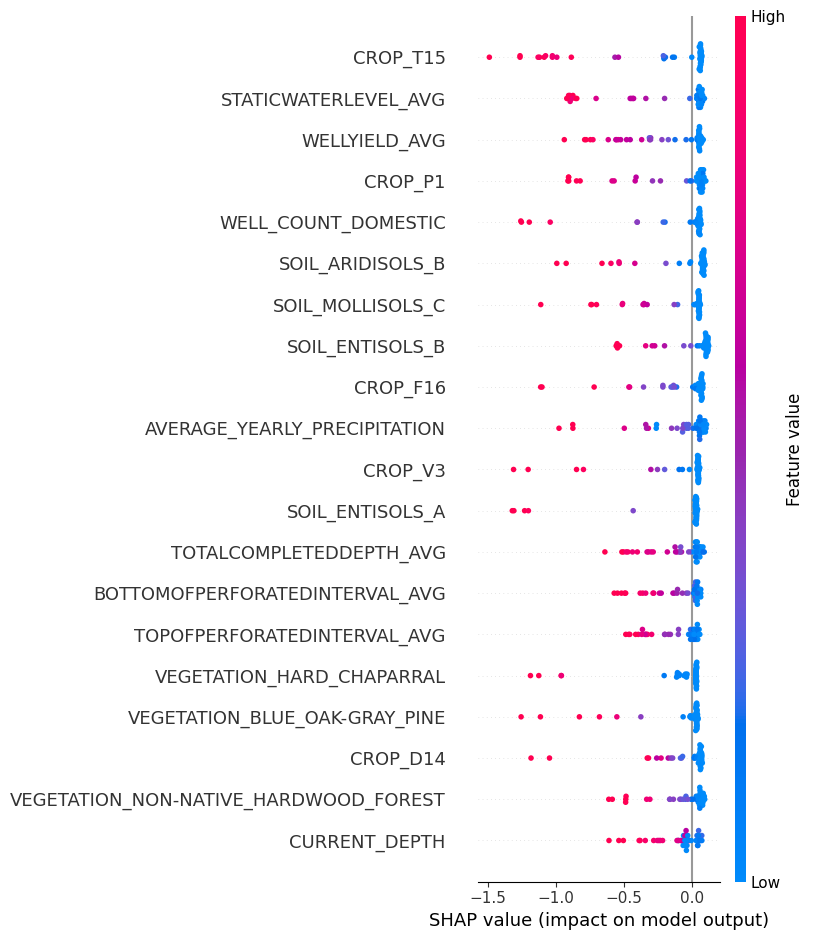

In [ ]:
# Create shap values and plot them
anomalies_df = anomalies_df.set_index(['TOWNSHIP_RANGE',  'YEAR'])
shap_values = shap.TreeExplainer(isomodel).shap_values(anomalies_df)
shap.summary_plot(shap_values, anomalies_df)

The summary plot shows the factors that dominate the features in Townships and years which are flagged anomolies by IsolationForest algorithm.

Noise 
DBScan algorithm has the advantage over KMeans clustering that it does not need to have the number of clusters specified before hand. It can predict noise. Works well with large datasets and that have more complex cluster shapes.

It is based on Network Graph theory. The connected component is a component in which any two vertices are connected to each other by paths. And are connected to no additional vertices in whatever the containing graph is connected. Components can be computed efficiently in time linear to the number of vertices or edges using a breadth-first or depth-first search.

`Jargon`
- Core samples : The definition of which points are considered core points (that form a dense region) by DBSCAN is controlled by two main parameters, called min samples and eps. Core points have at least min_samples neighbors in the eps distance.
- Boundary points are at an eps distance from core points but do not have min_samples neighbors themselves.
- Those that are not core pointsot Boundary points are noise.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=b042e2da-6536-449d-95b8-d85fa08825de' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>